In [ ]:
# Import necessary libraries
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

# Set up GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

from google.colab import drive
drive.mount('/content/drive')

base_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/dataset'

Found GPU at: /device:GPU:0
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


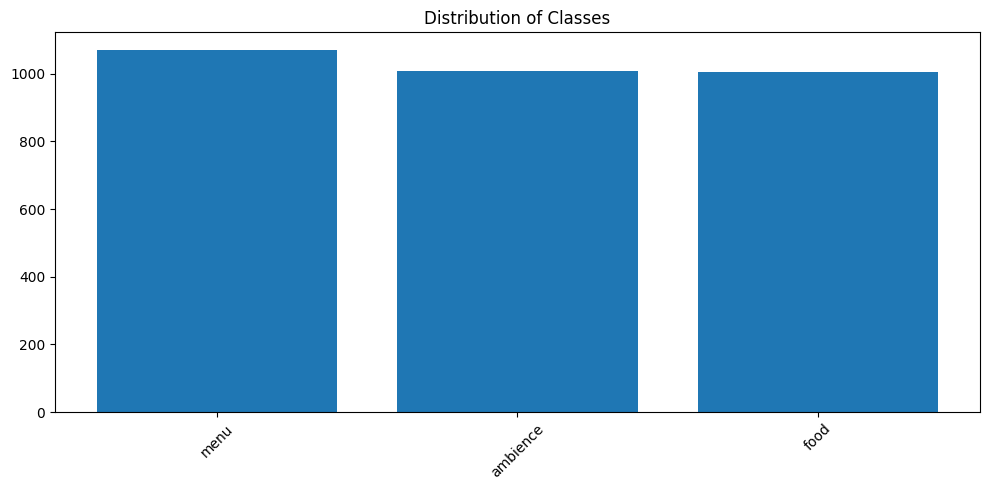

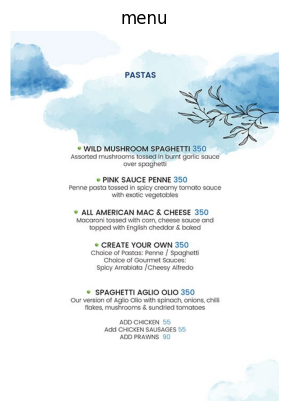

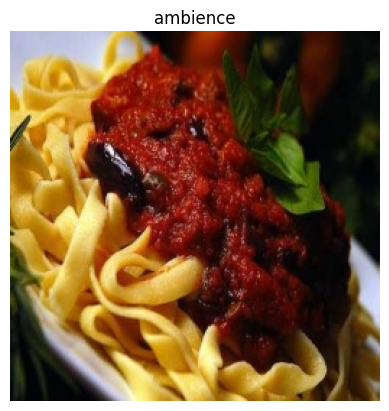

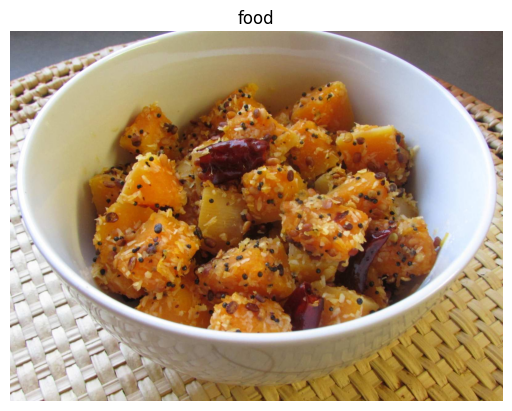

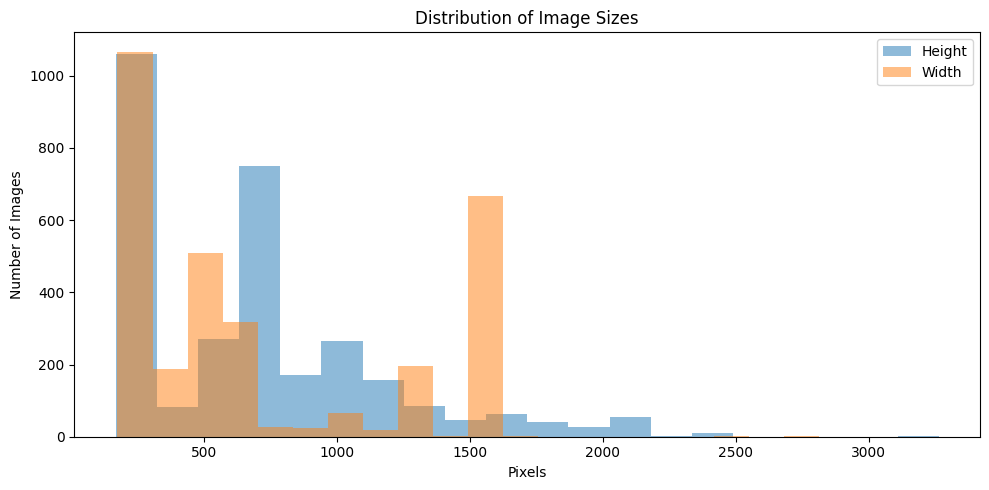

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

base_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/dataset'

valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp')

# Distribution of Classes
folders = [folder for folder in os.listdir(base_dir)
           if os.path.isdir(os.path.join(base_dir, folder)) and not folder.startswith('.')]

class_counts = {}

for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]
    class_counts[folder] = len(image_files)

plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.title('Distribution of Classes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Sample Images
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if image_files:
        for file in image_files:
            img_path = os.path.join(folder_path, file)
            try:
                img = Image.open(img_path)
                plt.imshow(img)
                plt.title(folder)
                plt.axis('off')
                plt.show()
                break  # Show only one image per class
            except Exception as e:
                print(f"Skipping file {file}: {e}")
    else:
        print(f"Folder '{folder}' is empty, skipping sample image display.")

# Image Sizes
heights = []
widths = []

for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    for image_name in image_files:
        img_path = os.path.join(folder_path, image_name)
        try:
            img = Image.open(img_path)
            widths.append(img.size[0])
            heights.append(img.size[1])
        except Exception as e:
            print(f"Skipping file {image_name}: {e}")

plt.figure(figsize=(10, 5))
plt.hist(heights, bins=20, alpha=0.5, label='Height')
plt.hist(widths, bins=20, alpha=0.5, label='Width')
plt.legend(loc='upper right')
plt.title('Distribution of Image Sizes')
plt.xlabel('Pixels')
plt.ylabel('Number of Images')
plt.tight_layout()
plt.show()


In [6]:
import os
from google.colab import drive

# Set the path to the 'foodimage' folder in your Google Drive
base_dir = base_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/dataset'

# List all the subdirectories (classes) in the 'foodimage' folder
folders = [folder for folder in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, folder)) and not folder.startswith('.')]

# Get the number of images in each class
class_counts = {}
for folder in folders:
    class_counts[folder] = len(os.listdir(os.path.join(base_dir, folder)))

# Print the number of images in each class
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} images")

menu: 1069 images
ambience: 1009 images
food: 1006 images


In [7]:
datadir = '/content/drive/MyDrive/ruchir/Photo Tagging/dataset'

In [8]:
import os
from pathlib import Path

datadir = '/content/drive/MyDrive/ruchir/Photo Tagging/dataset'

# Calculate the total number of images in the dataset
data_dir = Path(datadir)
image_count = len(list(data_dir.glob('*/*.jpg')))
print("Total number of images:", image_count)


Total number of images: 3062


In [9]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

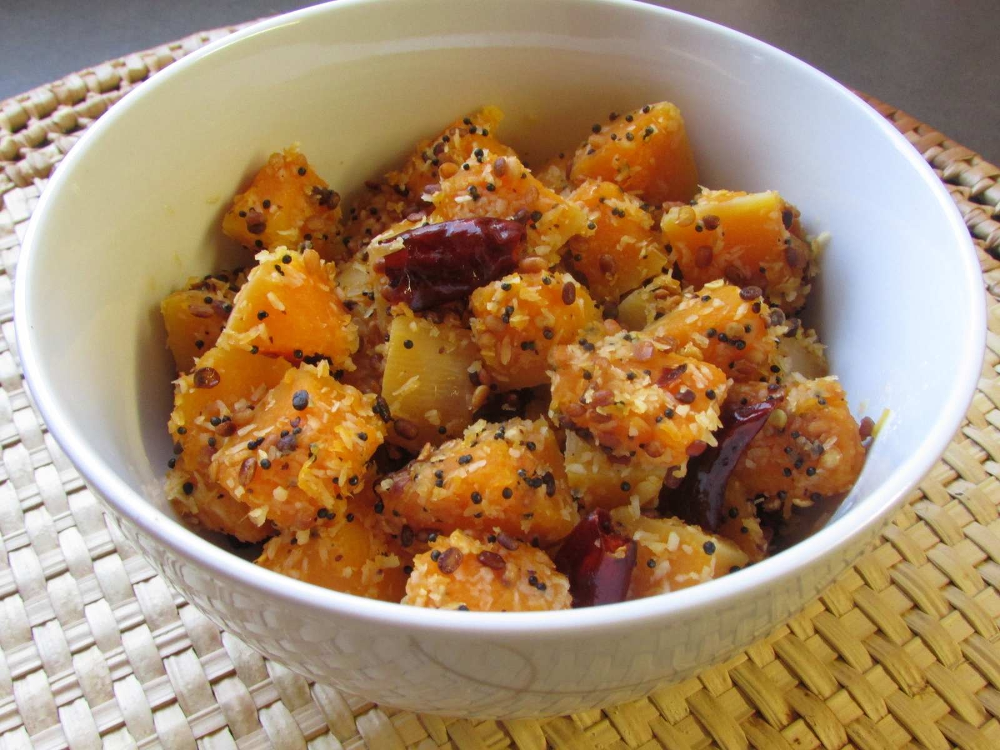

In [10]:
food= list(data_dir.glob('food/*'))
PIL.Image.open(str(food[0]))

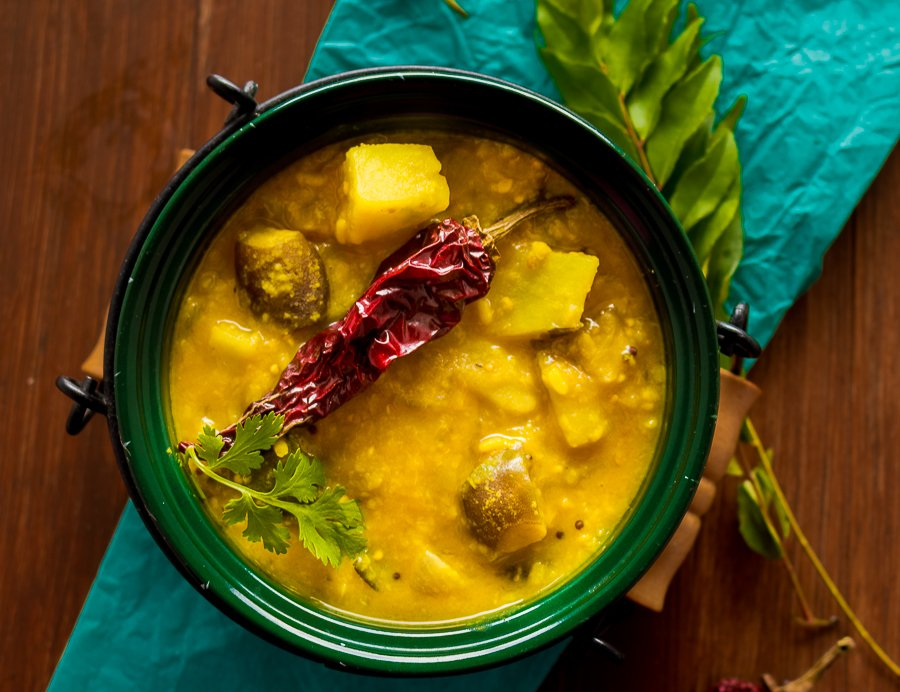

In [11]:
PIL.Image.open(str(food[1]))

Distribution of images

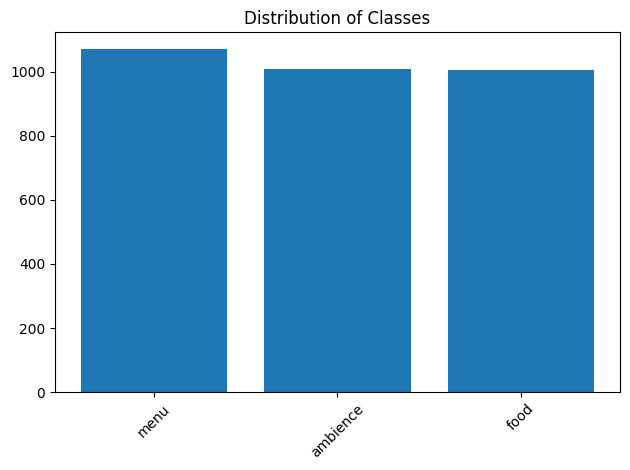

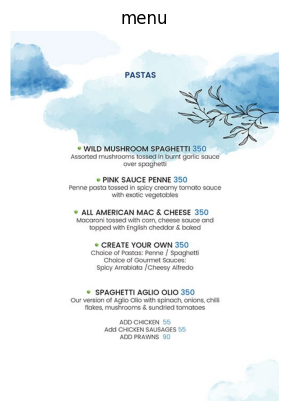

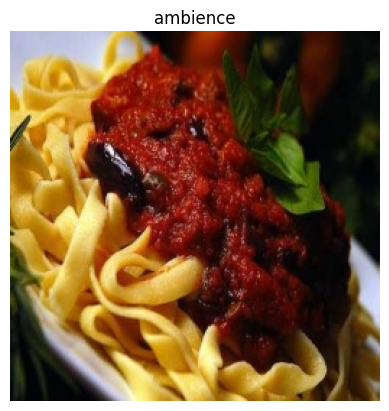

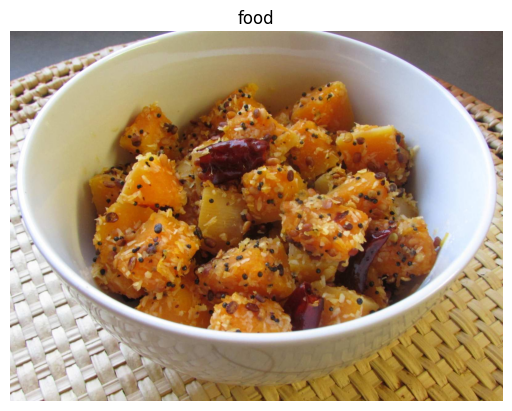

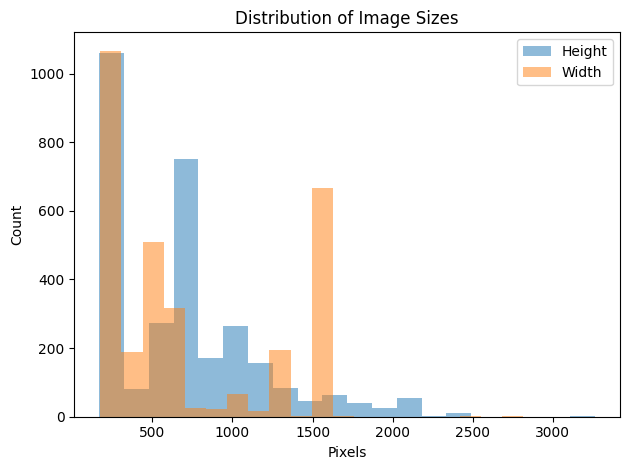

Heights: [700, 700, 700, 650, 700, 700, 700, 700, 700, 700, 700, 600, 650, 700, 700, 700, 700, 700, 700, 700, 700, 700, 700, 409, 700, 660, 600, 700, 700, 700, 700, 700, 700, 700, 350, 511, 506, 700, 518, 700, 505, 700, 506, 650, 571, 487, 523, 598, 515, 508, 519, 576, 458, 516, 551, 700, 600, 350, 700, 516, 520, 485, 512, 778, 600, 650, 650, 650, 650, 600, 600, 650, 607, 650, 550, 600, 600, 623, 700, 600, 700, 600, 650, 624, 650, 621, 624, 778, 600, 700, 600, 650, 650, 600, 600, 1654, 700, 600, 700, 650, 650, 600, 514, 650, 650, 650, 635, 492, 452, 650, 700, 600, 650, 600, 600, 650, 600, 523, 518, 700, 650, 650, 650, 574, 600, 1654, 650, 600, 600, 700, 597, 720, 631, 532, 509, 527, 700, 492, 586, 720, 700, 700, 651, 535, 700, 558, 650, 650, 544, 700, 540, 659, 700, 650, 538, 700, 700, 634, 538, 622, 700, 495, 539, 700, 513, 720, 700, 700, 573, 700, 548, 600, 650, 650, 700, 720, 650, 720, 650, 720, 700, 720, 650, 650, 650, 700, 720, 650, 700, 700, 650, 700, 506, 700, 474, 700, 650, 700

In [12]:
import matplotlib.pyplot as plt
import os
import csv
from PIL import Image

# Set your base directory path
base_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/dataset'

# Allowed image extensions
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')

# Distribution of Classes
folders = [folder for folder in os.listdir(base_dir)
           if os.path.isdir(os.path.join(base_dir, folder)) and not folder.startswith('.')]
class_counts = {}

for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]
    class_counts[folder] = len(image_files)

plt.bar(class_counts.keys(), class_counts.values())
plt.title('Distribution of Classes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Sample Images
for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if image_files:
        sample_image = image_files[0]
        img_path = os.path.join(folder_path, sample_image)
        try:
            img = Image.open(img_path)
            plt.imshow(img)
            plt.title(folder)
            plt.axis('off')
            plt.show()
        except Exception as e:
            print(f"Error reading {img_path}: {e}")
    else:
        print(f"Folder '{folder}' is empty or has no valid images.")

# Image Sizes
heights = []
widths = []

for folder in folders:
    folder_path = os.path.join(base_dir, folder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    for image_name in image_files:
        img_path = os.path.join(folder_path, image_name)
        try:
            img = Image.open(img_path)
            widths.append(img.size[0])
            heights.append(img.size[1])
        except Exception as e:
            print(f"Skipping file {image_name}: {e}")

plt.hist(heights, bins=20, alpha=0.5, label='Height')
plt.hist(widths, bins=20, alpha=0.5, label='Width')
plt.legend(loc='upper right')
plt.title('Distribution of Image Sizes')
plt.xlabel('Pixels')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

# 1. Printing Directly:
print("Heights:", heights)
print("Widths:", widths)

# 2. Storing in a CSV File:
with open('image_sizes.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Folder", "Image Name", "Height", "Width"])

    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

        for image_name in image_files:
            img_path = os.path.join(folder_path, image_name)
            try:
                img = Image.open(img_path)
                writer.writerow([folder, image_name, img.size[1], img.size[0]])  # PIL uses (width, height)
            except Exception as e:
                print(f"Skipping file {image_name}: {e}")


BEGIN IMAGE PROCESSING

In [13]:
import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from tensorflow.keras import models
from PIL import Image
from skimage.io import imread
import cv2

K.clear_session()

In [14]:
img = plt.imread('/content/drive/MyDrive/ruchir/Photo Tagging/dataset/food/6.Spicy_Cabbage_Rice.jpg')
dims = np.shape(img)
matrix = np.reshape(img, (dims[0] * dims[1], dims[2]))
print(np.shape(matrix))

(1707200, 3)


Image shape ->  (1067, 1600)
Color channels ->  3
Min color depth : 0, Max color depth 255


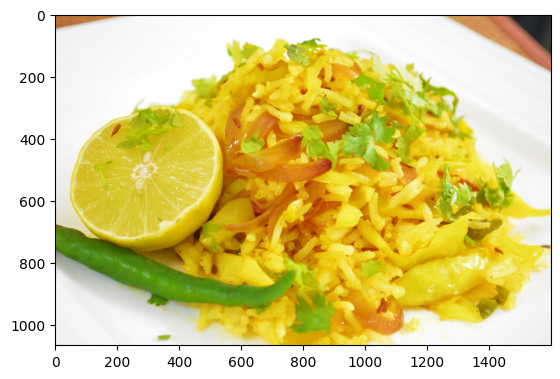

In [15]:
plt.imshow(img)
print("Image shape -> ",dims[:2])
print("Color channels -> ",dims[2])
print("Min color depth : {}, Max color depth {}".format(np.min(img),np.max(img)))

3 distribution plots

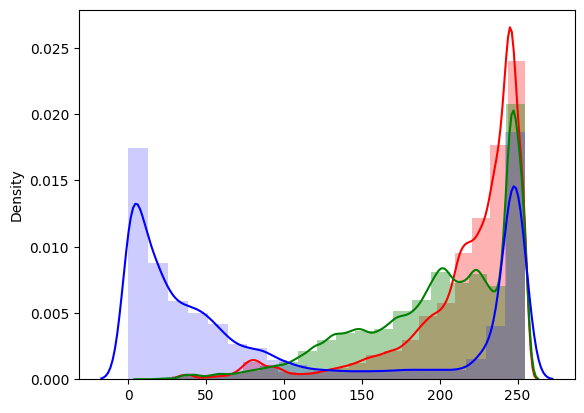

In [16]:
sns.distplot(matrix[:,0], bins=20,color="red",hist_kws=dict(alpha=0.3))
sns.distplot(matrix[:,1], bins=20,color="green",hist_kws=dict(alpha=0.35))
sns.distplot(matrix[:,2], bins=20,color="blue",hist_kws=dict(alpha=0.2))
plt.show()

2D histogram that visualizes the joint distribution of pixel values between the green and blue color

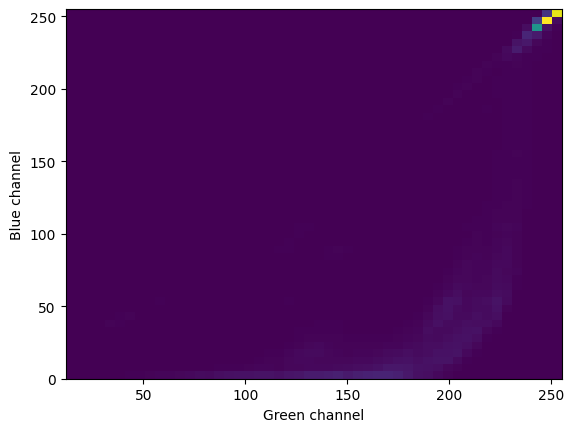

In [17]:
_ = plt.hist2d(matrix[:,1], matrix[:,2], bins=(50,50))
plt.xlabel('Green channel')
plt.ylabel('Blue channel')
plt.show()

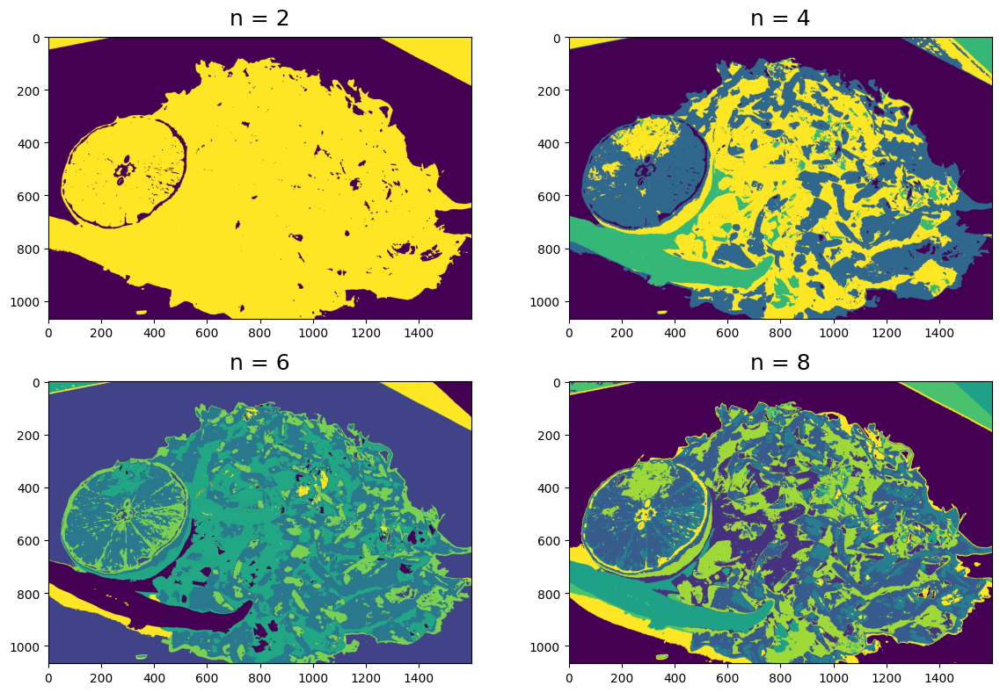

In [18]:
from sklearn import cluster
n_vals=[2,4,6,8]
plt.figure(1, figsize=(12, 8))

for subplot,n in enumerate(n_vals):
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered, (dims[0], dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n), pad = 10,size=18)
    plt.imshow(clustered_img)

plt.tight_layout()

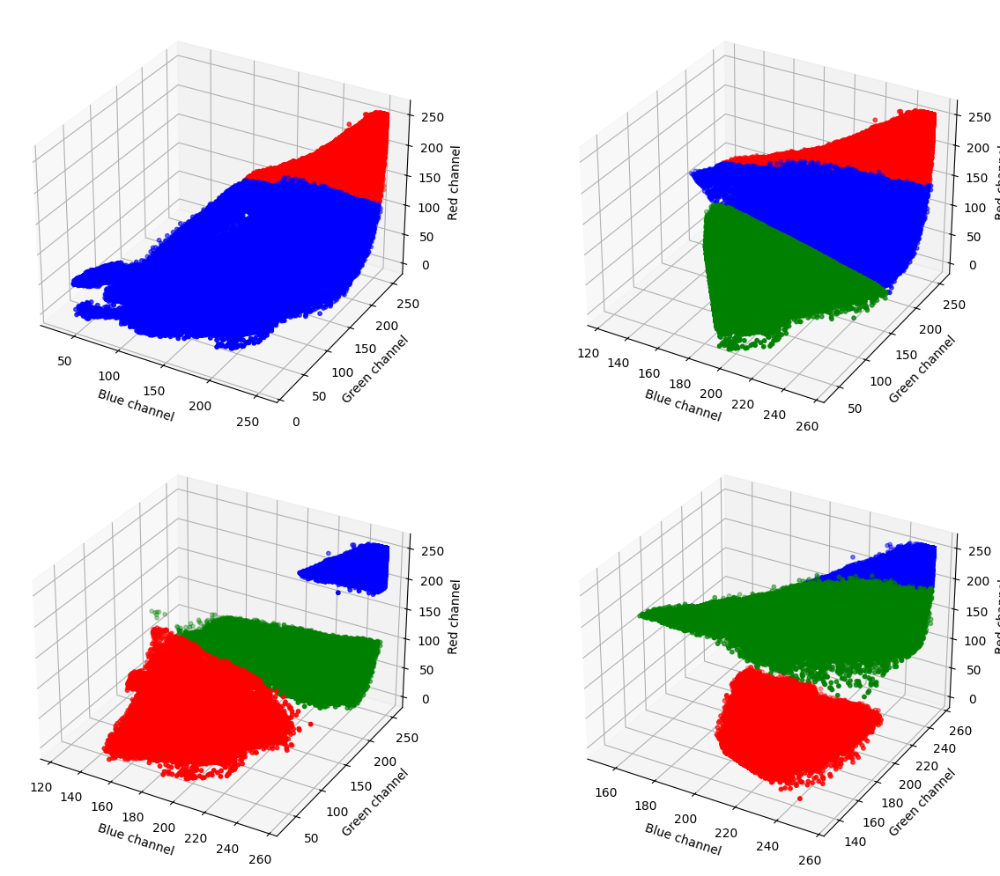

In [19]:
from mpl_toolkits.mplot3d import Axes3D

fig=plt.figure(figsize=(14,10))

ax = [fig.add_subplot(221, projection='3d'),
      fig.add_subplot(222, projection='3d'),
      fig.add_subplot(223, projection='3d'),
      fig.add_subplot(224, projection='3d')]

for plot_number,n in enumerate(n_vals):

    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    x1, y1, z1 = [np.where(clustered == x)[0] for x in [0, 1, 2]]

    plot_vals = [('r', x1),
                 ('b', y1),
                 ('g', z1),
                 ]

    for c, channel in plot_vals:
        x = matrix[channel, 0]
        y = matrix[channel, 1]
        z = matrix[channel, 2]
        ax[plot_number].scatter(x, y, z, c=c,s=10)

    ax[plot_number].set_xlabel('Blue channel')
    ax[plot_number].set_ylabel('Green channel')
    ax[plot_number].set_zlabel('Red channel')

plt.tight_layout()

normalization on the pixel values of an image and then displays the normalized image

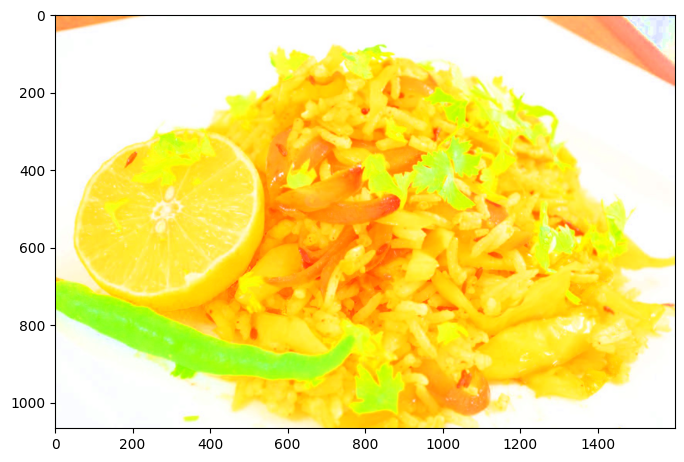

In [20]:
bnorm = np.zeros_like(matrix, dtype=np.float32)
max_range = np.max(matrix, axis=1)
bnorm = matrix / np.vstack((max_range, max_range, max_range)).T
bnorm_img = np.reshape(bnorm, (dims[0],dims[1],dims[2]))
plt.figure(figsize=(8,10))
plt.imshow(bnorm_img)
plt.show()

In [21]:
pip install scikit-image

In [22]:
!pip install --upgrade scikit-image

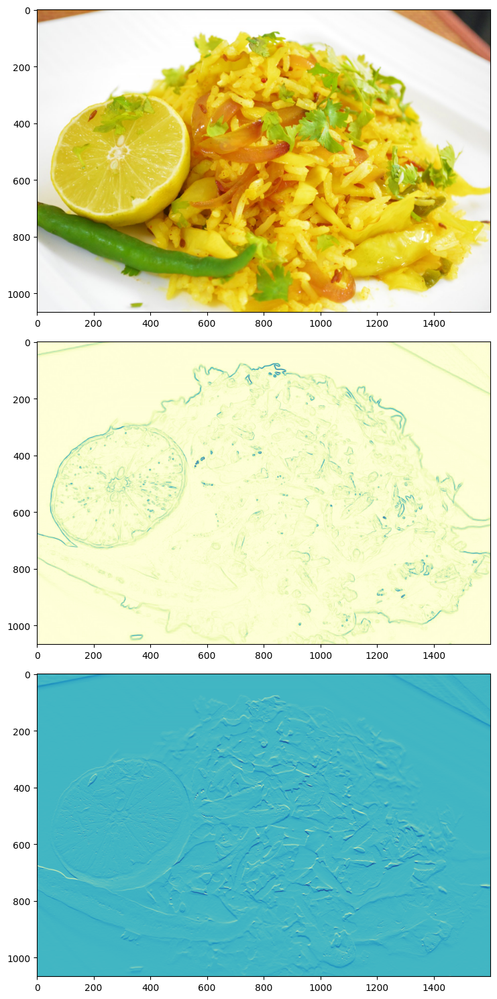

In [23]:
import skimage
from skimage.feature import graycomatrix, graycoprops
from skimage.filters import sobel
from skimage.filters import sobel_h

plt.figure(1,figsize=(20,15))
cmap="YlGnBu"
plt.subplot(3,1,1)
plt.imshow(img)

plt.subplot(3,1,2)
plt.imshow(sobel(img[:,:,2]),cmap=cmap)

plt.subplot(3,1,3)
plt.imshow(sobel_h(img[:,:,1]), cmap=cmap)

plt.tight_layout()

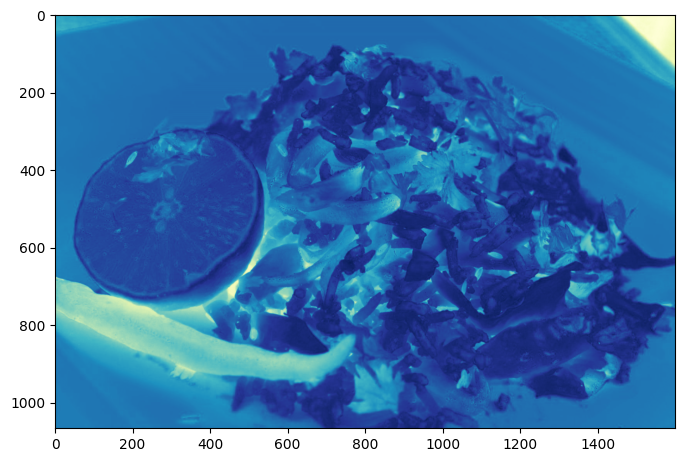

In [24]:
from sklearn.decomposition import PCA

pca = PCA(3)
pca.fit(matrix)
img_pca = pca.transform(matrix)
img_pca = np.reshape(img_pca, (dims[0], dims[1], dims[2]))

fig = plt.figure(figsize=(8, 8))
plt.imshow(img_pca[:,:,1], cmap=cmap)

Visualization of different classes

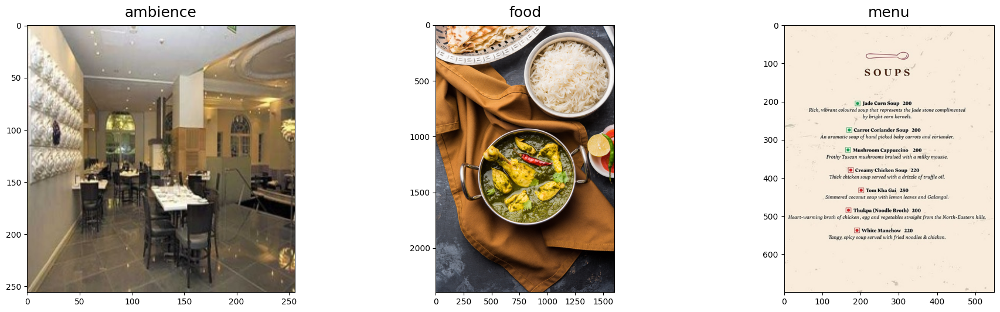

In [25]:
import os
import matplotlib.pyplot as plt
import numpy as np

# Updated path to the newly created train directory
train_folder = "/content/drive/MyDrive/ruchir/Photo Tagging/train"

images = []

# Loop through each food class folder in the train directory
for food_folder in sorted(os.listdir(train_folder)):
    food_items = os.listdir(os.path.join(train_folder, food_folder))

    # Randomly select an image from the current food class
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder, food_folder, food_selected))

# Visualization
fig = plt.figure(1, figsize=(25, 25))

for subplot, image_ in enumerate(images):
    category = image_.split('/')[-2]
    imgs = plt.imread(image_)
    fig = plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad=10, size=18)
    plt.imshow(imgs)

plt.tight_layout()
plt.show()


In [26]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy

In [27]:
PATH = "/content/drive/MyDrive/ruchir/Photo Tagging/dataset"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# make sure my GPU is detected.
print(device)

cuda:0


In [28]:
data_transforms = {
    'Train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'Valid': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [29]:
from torchvision import transforms

# Define data transformations with additional options
data_transforms = {
    'Train': transforms.Compose([
        # Random crop and resize to 224x224 for training
        transforms.RandomResizedCrop(224),

        # Random horizontal flip for data augmentation
        transforms.RandomHorizontalFlip(),

        # Convert images to tensor
        transforms.ToTensor(),

        # Normalize images using ImageNet statistics
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),

        # Additional augmentation (Optional)
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
        transforms.RandomRotation(30)  # Optional: Add rotation for better augmentation
    ]),
    'Valid': transforms.Compose([
        # Resize to 256px and then center crop to 224x224 for validation
        transforms.Resize(256),
        transforms.CenterCrop(224),

        # Convert images to tensor
        transforms.ToTensor(),

        # Normalize images using ImageNet statistics
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [30]:
from torchvision import datasets, transforms
from torch.utils.data import random_split, DataLoader
import os

# Define path to the main directory
PATH = "/content/drive/MyDrive/ruchir/Photo Tagging"

# Define your data transforms (these can be adjusted)
data_transforms = {
    'Train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'Valid': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Load the full dataset from the 'train' folder
full_dataset = datasets.ImageFolder(os.path.join(PATH, 'train'), transform=data_transforms['Train'])

# Define sizes for training and validation splits (80%-20%)
train_size = int(0.8 * len(full_dataset))
valid_size = len(full_dataset) - train_size

# Split the dataset into training and validation datasets
train_dataset, valid_dataset = random_split(full_dataset, [train_size, valid_size])

# Create DataLoader for both datasets
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=True, num_workers=4)

# Check dataset sizes
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(valid_dataset)}")


Training dataset size: 1918
Validation dataset size: 480


In [34]:
import os
from torchvision import datasets, transforms

# Define data transformations for train and validation sets
data_transforms = {
    'Train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]),
    'Valid': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ]),
}

# Specify the data directory (adjust path as needed)
data_dir = '/content/drive/MyDrive/ruchir/Photo Tagging'

# Load datasets for Train and Validation
image_datasets = {
    'Train': datasets.ImageFolder(root=os.path.join(data_dir, 'train'), transform=data_transforms['Train']),
    'Valid': datasets.ImageFolder(root=os.path.join(data_dir, 'valid'), transform=data_transforms['Valid'])

}

# Get class names
class_names = image_datasets['Train'].classes
print(class_names)


['ambience', 'food', 'menu']


In [35]:
class_names = image_datasets['Train'].classes
print(class_names)

['ambience', 'food', 'menu']


In [36]:
# create a function image show

def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

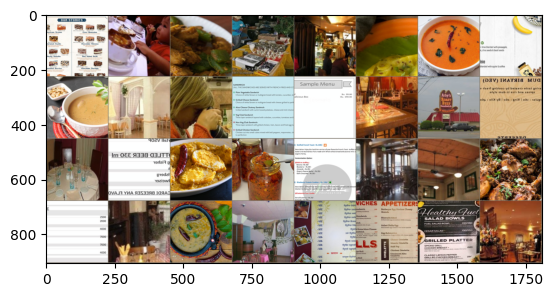

In [37]:
from torch.utils.data import DataLoader

# Define batch size
batch_size = 32

# Create DataLoader for Train and Valid datasets
dataloaders = {
    'Train': DataLoader(image_datasets['Train'], batch_size=batch_size, shuffle=True, num_workers=4),
    'Valid': DataLoader(image_datasets['Valid'], batch_size=batch_size, shuffle=False, num_workers=4)
}

# Get a batch of training data
inputs, classes = next(iter(dataloaders['Train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

# Display the grid of images
import matplotlib.pyplot as plt
def imshow(inp):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean  # unnormalize
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    plt.show()

imshow(out)


In [38]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['Train', 'Valid']:
            if phase == 'Train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'Train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'Train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'Train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # deep copy the model
            if phase == 'Valid' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best Valid Acc: {best_acc:4f}')

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [39]:
model_1 = models.resnet18(pretrained=True)
num_ftrs = model_1.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
model_1.fc = nn.Linear(num_ftrs, len(class_names))

model_1 = model_1.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_sgd = optim.SGD(model_1.parameters(), lr=0.001, momentum=0.9)
optimizer_adam = optim.Adam(model_1.parameters(), lr=0.001)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_adam, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 186MB/s]


In [42]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchvision import models
from torch.utils.data import DataLoader
import time
import copy

# Define the device (set to 'mps' for Apple Silicon Mac GPU support)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize the pre-trained model
model_1 = models.resnet18(pretrained=True)

# Modify the final layer for your specific task (replace 'class_names' with actual number of classes)
num_ftrs = model_1.fc.in_features
model_1.fc = nn.Linear(num_ftrs, len(class_names))  # Ensure 'class_names' is defined correctly

# Move the model to the appropriate device (MPS if available)
model_1 = model_1.to(device)

# Define the criterion and optimizers
criterion = nn.CrossEntropyLoss()

# Optimizers
optimizer_sgd = optim.SGD(model_1.parameters(), lr=0.001, momentum=0.9)
optimizer_adam = optim.Adam(model_1.parameters(), lr=0.001)

# Learning rate scheduler
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_adam, step_size=7, gamma=0.1)

# Define dataset_sizes (make sure image_datasets is defined earlier)
dataset_sizes = {x: len(image_datasets[x]) for x in ['Train', 'Valid']}

# Define the training and validation loops
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    # Loop through epochs
    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['Train', 'Valid']:
            if phase == 'Train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluation mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Zero the parameter gradients
                optimizer.zero_grad()

                # Forward
                with torch.set_grad_enabled(phase == 'Train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # Backward + optimize only if in training phase
                    if phase == 'Train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'Train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Deep copy the model
            if phase == 'Valid' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    # Load best model weights
    model.load_state_dict(best_model_wts)
    return model

# Run the training
model_1 = train_model(model_1, criterion, optimizer_adam, exp_lr_scheduler, num_epochs=5)


Epoch 0/4
----------
Train Loss: 0.1932 Acc: 0.9308
Valid Loss: 0.1036 Acc: 0.9688

Epoch 1/4
----------
Train Loss: 0.0840 Acc: 0.9733
Valid Loss: 0.0696 Acc: 0.9819

Epoch 2/4
----------
Train Loss: 0.0909 Acc: 0.9675
Valid Loss: 0.1140 Acc: 0.9639

Epoch 3/4
----------
Train Loss: 0.0922 Acc: 0.9687
Valid Loss: 0.1435 Acc: 0.9639

Epoch 4/4
----------
Train Loss: 0.0632 Acc: 0.9791
Valid Loss: 0.0262 Acc: 0.9901

Training complete in 3m 7s
Best val Acc: 0.9901


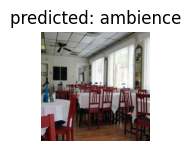

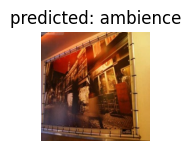

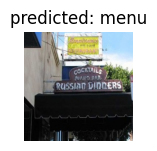

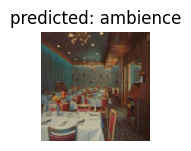

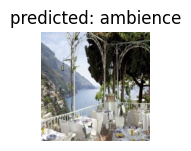

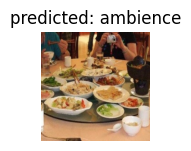

In [43]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['Valid']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)


# Visualize model
visualize_model(model_1)

ambience: 1.00
food: 0.00
menu: 0.00


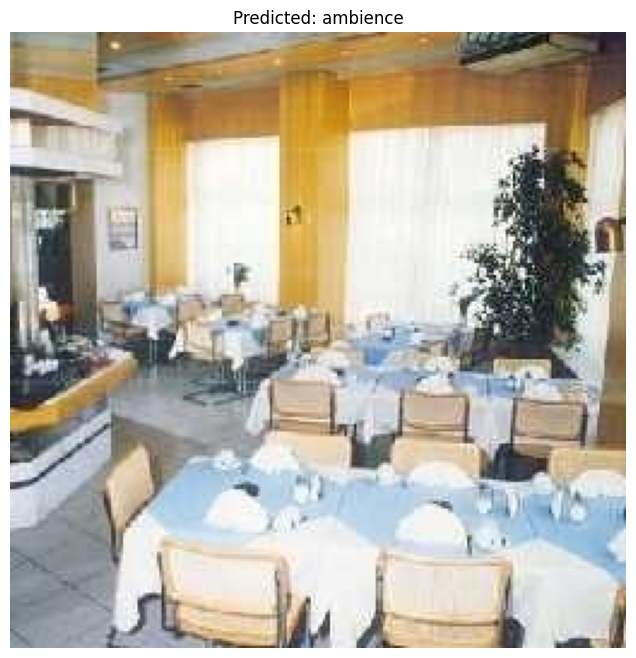

In [44]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from PIL import Image

def visualize_single_image(model, image_path, class_names):
    was_training = model.training
    model.eval()

    # Load and preprocess the image
    img = Image.open(image_path)
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img_tensor = preprocess(img).unsqueeze(0)

    # Move the tensor to the same device as the mot the dedel
    device = next(model.parameters()).device  # Gevice of the model
    img_tensor = img_tensor.to(device)  # Move the tensor to that device

    with torch.no_grad():
        outputs = model(img_tensor)
        _, preds = torch.max(outputs, 1)
        confidence = torch.nn.functional.softmax(outputs, dim=1)[0]  # Get the confidence scores

        # Display the image and prediction results
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Predicted: {class_names[preds[0]]}')

        for i, (class_name, conf) in enumerate(zip(class_names, confidence.cpu())):
            print(f"{class_name}: {conf:.2f}")

        model.train(mode=was_training)


# Specify the path to the image you want to visualize
image_path = "/content/drive/MyDrive/ruchir/Photo Tagging/train/ambience/09K53DODLB5K.jpg"  # Update with the actual path

# Specify the class names
class_names = image_datasets['Train'].classes  # Update with the actual class names

# Visualize the single image
visualize_single_image(model_1, image_path, class_names)


In [45]:
pip install hypopt

In [46]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
# Importing sklearn libraries
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score

# Importing hypopt library for grid search
from hypopt import GridSearch

# Importing Keras libraries
# from keras.utils import np_utils  # np_utils is deprecated
from tensorflow.keras.utils import to_categorical # Use to_categorical instead
from keras.models import Sequential
from keras.applications import VGG16
from keras.applications import imagenet_utils
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import load_img, img_to_array
from keras.layers import Dense, Conv2D, MaxPooling2D
from keras.layers import Dropout, Flatten, GlobalAveragePooling2D

import warnings
warnings.filterwarnings('ignore')

In [47]:
import os
import shutil

base_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/dataset'
dest_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/ruchir'

# Ensure the destination directories exist
os.makedirs(dest_dir, exist_ok=True)

splits = ['training', 'validation', 'test']
for split in splits:
    os.makedirs(os.path.join(dest_dir, split), exist_ok=True)

# Define the class mapping
class_map = {'ambience': 0, 'food': 1, 'menu': 2}

# Copy the images to the new structure with the desired split
for class_name, class_idx in class_map.items():
    class_folder = os.path.join(base_dir, class_name)
    all_images = os.listdir(class_folder)

    # Shuffle the images to ensure random distribution
    random.shuffle(all_images)

    # Split the images
    train_images = all_images[:int(0.7 * len(all_images))]
    val_images = all_images[int(0.7 * len(all_images)):int(0.9 * len(all_images))]
    test_images = all_images[int(0.9 * len(all_images)):]

    for img in train_images:
        # Add error handling for shutil.copy
        try:
            shutil.copy(os.path.join(class_folder, img), os.path.join(dest_dir, 'training', f"{class_idx}_{img}"))
        except OSError as e:
            print(f"Error copying {img}: {e}")
            # You might want to add logic to skip the file or handle the error differently

    for img in val_images:
        # Add error handling for shutil.copy
        try:
            shutil.copy(os.path.join(class_folder, img), os.path.join(dest_dir, 'validation', f"{class_idx}_{img}"))
        except OSError as e:
            print(f"Error copying {img}: {e}")
            # You might want to add logic to skip the file or handle the error differently


    for img in test_images:
        # Add error handling for shutil.copy
        try:
            shutil.copy(os.path.join(class_folder, img), os.path.join(dest_dir, 'test', f"{class_idx}_{img}"))
        except OSError as e:
            print(f"Error copying {img}: {e}")

In [48]:
import os

dest_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/ruchir'
splits = ['training', 'validation', 'test']

def extract_classes_from_filenames(filenames):
    # Extract class indices from filenames and return as a set
    return set([int(filename.split('_')[0]) for filename in filenames])

for split in splits:
    split_dir = os.path.join(dest_dir, split)
    all_files = os.listdir(split_dir)
    unique_classes = extract_classes_from_filenames(all_files)

    print(f"In '{split}' directory, unique classes present are: {unique_classes}")


In 'training' directory, unique classes present are: {0, 1, 2}
In 'validation' directory, unique classes present are: {0, 1, 2}
In 'test' directory, unique classes present are: {0, 1, 2}


In [49]:
train = [os.path.join("/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/training",img) for img in os.listdir("/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/training")]
val = [os.path.join("/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/validation",img) for img in os.listdir("/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/validation")]
test = [os.path.join("/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/test",img) for img in os.listdir("/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/test")]

In [50]:
len(train),len(val),len(test)

(2158, 617, 309)

In [51]:
train[0:5]

['/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/training/0_MOCVLZJ8HW5R.jpg',
 '/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/training/0_JUPP1KVGP0DH.jpg',
 '/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/training/0_FRYTQGP3TFJ9.jpg',
 '/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/training/0_QHVYG27F7SRZ.jpg',
 '/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/training/0_FIFGY9BP2WER.jpg']

In [52]:
train_y = [int(img.split("/")[-1].split("_")[0]) for img in train]
val_y = [int(img.split("/")[-1].split("_")[0]) for img in val]
test_y = [int(img.split("/")[-1].split("_")[0]) for img in test]

In [53]:
import numpy as np
from tensorflow.keras.utils import to_categorical # Import the correct function

num_classes = 6
y_train = to_categorical(train_y, num_classes) # Use the correct function name
y_val = to_categorical(val_y, num_classes)
y_test = to_categorical(test_y, num_classes)

In [54]:
y_train[0:5]

array([[1., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0.]])

Train class distribution for our Tensorflow training

Training data available in 3 classes
[706, 704, 748]


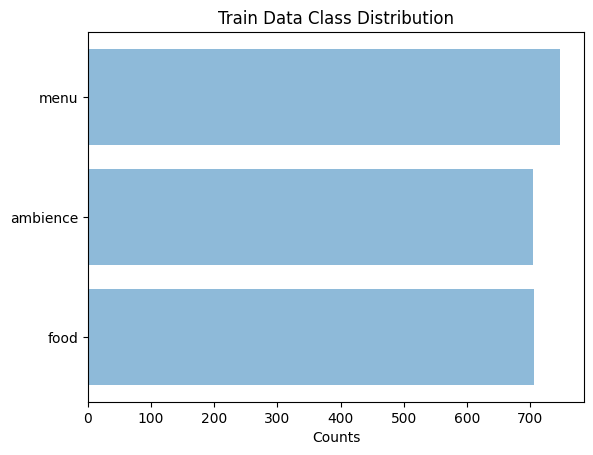

In [55]:
print("Training data available in 3 classes")
print([train_y.count(i) for i in range(0,3)])

restaurant_classes = ('food','ambience','menu')

y_pos = np.arange(len(restaurant_classes))
counts = [train_y.count(i) for i in range(0,3)]

plt.barh(y_pos, counts, align='center', alpha=0.5)
plt.yticks(y_pos, restaurant_classes)
plt.xlabel('Counts')
plt.title('Train Data Class Distribution')

plt.show()

In [56]:
print("Validation data available in 3 classes")
[val_y.count(i) for i in range(0,3)]

Validation data available in 3 classes


[202, 201, 214]

test data representaion

In [57]:
print("Test data available in 3 classes")
[test_y.count(i) for i in range(0,3)]

Test data available in 3 classes


[101, 101, 107]

In [58]:
def show_imgs(X):
    plt.figure(figsize=(8, 8))
    k = 0
    for i in range(0,4):
        for j in range(0,4):
            image = load_img(train[k], target_size=(224, 224))
            plt.subplot2grid((4,4),(i,j))
            plt.imshow(image)
            k = k+1
    # show the plot
    plt.show()

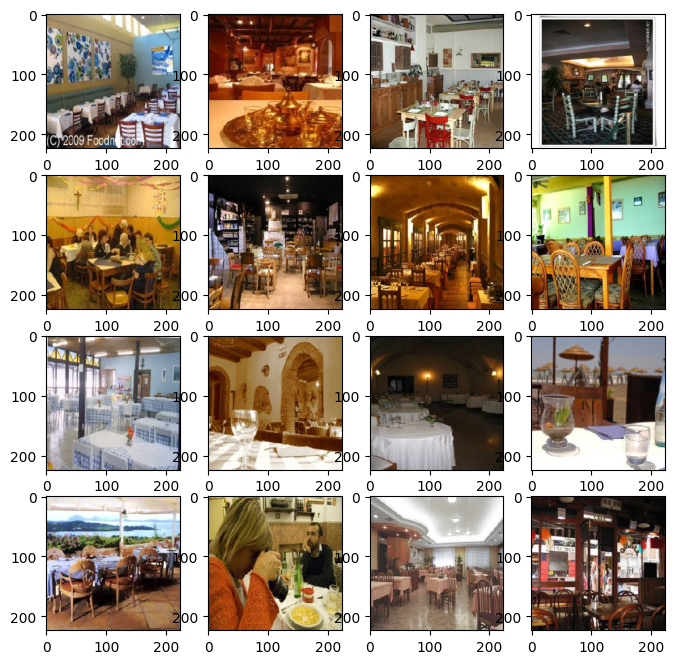

In [59]:
show_imgs(train)

[INFO] loading network...
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


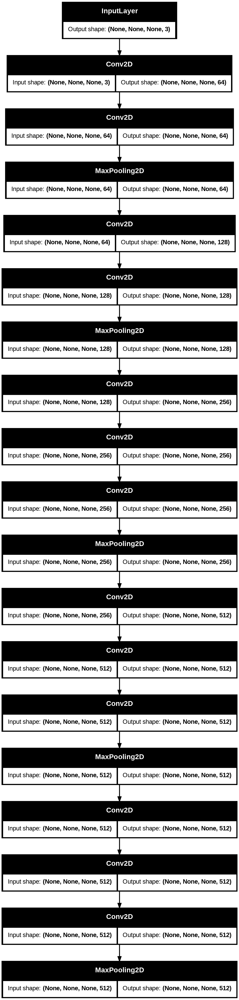

In [60]:
# load the VGG16 network and initialize the label encoder
print("[INFO] loading network...")
model = VGG16(weights="imagenet", include_top=False)
#model.summary()
tf.keras.utils.plot_model(model, show_shapes=True)

In [61]:
def create_features(dataset, pre_model):

    x_scratch = []

    # loop over the images
    for imagePath in dataset:

        # load the input image and image is resized to 224x224 pixels
        image = load_img(imagePath, target_size=(224, 224))
        image = img_to_array(image)

        # preprocess the image by (1) expanding the dimensions and
        # (2) subtracting the mean RGB pixel intensity from the
        # ImageNet dataset
        image = np.expand_dims(image, axis=0)
        image = imagenet_utils.preprocess_input(image)

        # add the image to the batch
        x_scratch.append(image)

    x = np.vstack(x_scratch)
    features = pre_model.predict(x, batch_size=32)
    features_flatten = features.reshape((features.shape[0], 7 * 7 * 512))
    return x, features, features_flatten

usin the create_features function to generate feature representations for images in the training, validation, and test datasets using a pre-trained model

In [62]:
train_x, train_features, train_features_flatten = create_features(train, model)
val_x, val_features, val_features_flatten = create_features(val, model)
test_x, test_features, test_features_flatten = create_features(test, model)

68/68 ━━━━━━━━━━━━━━━━━━━━ 29s 255ms/step
20/20 ━━━━━━━━━━━━━━━━━━━━ 8s 407ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step


In [63]:
print(train_x.shape, train_features.shape, train_features_flatten.shape)
print(val_x.shape, val_features.shape, val_features_flatten.shape)
print(test_x.shape, test_features.shape, test_features_flatten.shape)

(2158, 224, 224, 3) (2158, 7, 7, 512) (2158, 25088)
(617, 224, 224, 3) (617, 7, 7, 512) (617, 25088)
(309, 224, 224, 3) (309, 7, 7, 512) (309, 25088)


REGULARIZATION

In [64]:
from tensorflow.keras.regularizers import l2


In [65]:
reg_strength = 0.01  # This is a hyperparameter you can tune

# Creating a checkpointer
checkpointer = ModelCheckpoint(filepath='scratchmodellll.best.keras',
                               verbose=1,save_best_only=True)

model = Sequential()

# Convolutional layers
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten layer
model.add(Flatten())

# Dense layers with L2 regularization
model.add(Dense(512, activation='relu', kernel_regularizer=l2(reg_strength)))
model.add(Dropout(0.5))
model.add(Dense(6, activation='softmax', kernel_regularizer=l2(reg_strength)))

model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    44,302,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,399,174 (169.37 MB)

 Trainable params: 44,399,174 (169.37 MB)

 Non-trainable params: 0 (0.00 B)

Compiling and training from scratch for comparison and iteratioons

In [66]:
from tensorflow.keras.optimizers import Adam

# Define the optimizer with a custom learning rate
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

#Fitting the model on the train data and labels.
history = model.fit(train_x, y_train,
          batch_size=8, epochs=10,
          verbose=1, callbacks=[checkpointer],
          validation_data=(val_x, y_val), shuffle=True)


Epoch 1/10
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - accuracy: 0.6854 - loss: 27.9332
Epoch 1: val_loss improved from inf to 6.98532, saving model to scratchmodellll.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 24s 70ms/step - accuracy: 0.6859 - loss: 27.8811 - val_accuracy: 0.8930 - val_loss: 6.9853
Epoch 2/10
269/270 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9567 - loss: 6.5343
Epoch 2: val_loss improved from 6.98532 to 6.05666, saving model to scratchmodellll.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 33s 52ms/step - accuracy: 0.9567 - loss: 6.5329 - val_accuracy: 0.9287 - val_loss: 6.0567
Epoch 3/10
269/270 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9929 - loss: 5.7008
Epoch 3: val_loss improved from 6.05666 to 5.51004, saving model to scratchmodellll.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 27s 102ms/step - accuracy: 0.9929 - loss: 5.6995 - val_accuracy: 0.9238 - val_loss: 5.5100
Epoch 4/10
269/270 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9788 - loss: 5.0778
Epoch 4: va

2nd Iteration, Training from the scratch below

In [67]:
# Creating a checkpointer
checkpointer = ModelCheckpoint(filepath='scratchmodel.best.keras',
                               verbose=1,save_best_only=True)

# Building up a Sequential model
model_scratch = Sequential()
model_scratch.add(Conv2D(32, (3, 3), activation='relu',input_shape = train_x.shape[1:]))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))

model_scratch.add(Conv2D(64, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))

model_scratch.add(Conv2D(64, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))

model_scratch.add(Conv2D(128, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))

model_scratch.add(Conv2D(256, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))

model_scratch.add(Conv2D(512, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))

model_scratch.add(GlobalAveragePooling2D())
model_scratch.add(Dense(512, activation='relu'))
model_scratch.add(Dense(6, activation='softmax'))
model_scratch.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 10, 10, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 5, 5, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 3, 3, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 1, 1, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,871,238 (7.14 MB)

 Trainable params: 1,871,238 (7.14 MB)

 Non-trainable params: 0 (0.00 B)

compiling and training again

In [68]:
model_scratch.compile(loss='categorical_crossentropy', optimizer='adam',
              metrics=['accuracy'])

#Fitting the model on the train data and labels.
history = model_scratch.fit(train_x, y_train,
          batch_size=8, epochs=20,
          verbose=1, callbacks=[checkpointer],
          validation_data=(val_x, y_val), shuffle=True)

Epoch 1/20
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.6093 - loss: 3.3618
Epoch 1: val_loss improved from inf to 0.49504, saving model to scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - accuracy: 0.6098 - loss: 3.3536 - val_accuracy: 0.8088 - val_loss: 0.4950
Epoch 2/20
269/270 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8539 - loss: 0.4077
Epoch 2: val_loss improved from 0.49504 to 0.37926, saving model to scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.8540 - loss: 0.4074 - val_accuracy: 0.8590 - val_loss: 0.3793
Epoch 3/20
269/270 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9056 - loss: 0.2791
Epoch 3: val_loss improved from 0.37926 to 0.32596, saving model to scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.9057 - loss: 0.2789 - val_accuracy: 0.8849 - val_loss: 0.3260
Epoch 4/20
267/270 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.9060 - loss: 0.2857
Epoch 4: val_loss improve

Plotting the Train and Validation accuracy, Loss including

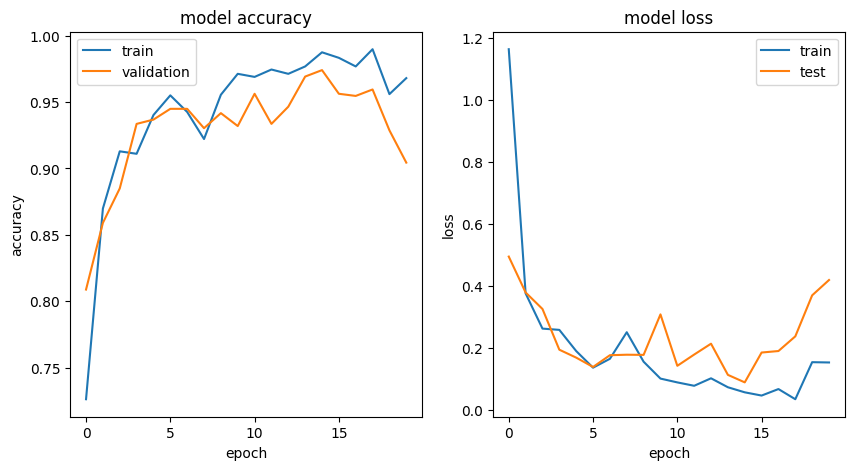

In [69]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

In [70]:
preds = np.argmax(model_scratch.predict(test_x), axis=1)
print("\nAccuracy on Test Data: ", accuracy_score(test_y, preds))
print("\nNumber of correctly identified imgaes: ",
      accuracy_score(test_y, preds, normalize=False),"\n")
confusion_matrix(test_y, preds, labels=range(0,6))

10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 171ms/step

Accuracy on Test Data:  0.8932038834951457

Number of correctly identified imgaes:  276.0 



array([[101,   0,   0,   0,   0,   0],
       [ 14,  87,   0,   0,   0,   0],
       [ 14,   5,  88,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0]])

implementing transfer lerning

In [71]:
model_transfer = Sequential()
model_transfer.add(GlobalAveragePooling2D(input_shape=train_features.shape[1:]))
model_transfer.add(Dropout(0.3))
model_transfer.add(Dense(100, activation='relu'))
model_transfer.add(Dense(6, activation='softmax'))
model_transfer.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │        51,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │           606 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,906 (202.76 KB)

 Trainable params: 51,906 (202.76 KB)

 Non-trainable params: 0 (0.00 B)

implememnting another 3rd iteration to retrain

In [72]:
model_transfer.compile(loss='categorical_crossentropy', optimizer='adam',
              metrics=['accuracy'])
history = model_transfer.fit(train_features, y_train, batch_size=8, epochs=15,
          validation_data=(val_features, y_val), callbacks=[checkpointer],
          verbose=1, shuffle=True)

Epoch 1/15
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8994 - loss: 1.1578
Epoch 1: val_loss improved from 0.08921 to 0.07227, saving model to scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8997 - loss: 1.1548 - val_accuracy: 0.9887 - val_loss: 0.0723
Epoch 2/15
259/270 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9928 - loss: 0.0540
Epoch 2: val_loss improved from 0.07227 to 0.04485, saving model to scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9928 - loss: 0.0541 - val_accuracy: 0.9919 - val_loss: 0.0449
Epoch 3/15
250/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9890 - loss: 0.0803
Epoch 3: val_loss did not improve from 0.04485
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9889 - loss: 0.0808 - val_accuracy: 0.9951 - val_loss: 0.0490
Epoch 4/15
254/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9928 - loss: 0.0530
Epoch 4: val_loss did not improve from 0.04485
270/270 ━━━━━━━━━━━━━━━━━━

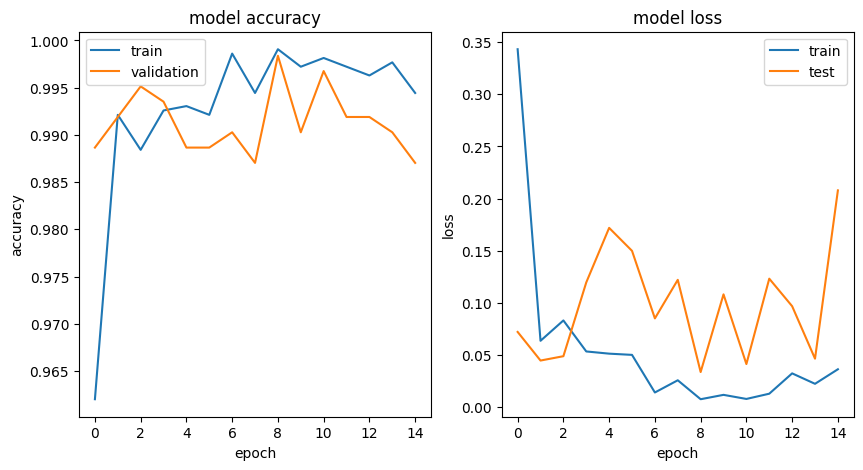

In [73]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

In [74]:
preds = np.argmax(model_transfer.predict(test_features), axis=1)
print("\nAccuracy on Test Data: ", accuracy_score(test_y, preds))
print("\nNumber of correctly identified imgaes: ",
      accuracy_score(test_y, preds, normalize=False),"\n")
confusion_matrix(test_y, preds, labels=range(0,6))

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

Accuracy on Test Data:  0.9935275080906149

Number of correctly identified imgaes:  307.0 



array([[100,   1,   0,   0,   0,   0],
       [  0, 101,   0,   0,   0,   0],
       [  0,   1, 106,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0]])

Implementing another 4th iteration

In [75]:
model_transfer.compile(loss='categorical_crossentropy', optimizer='adam',
              metrics=['accuracy'])
history = model_transfer.fit(train_features, y_train, batch_size=8, epochs=15,
          validation_data=(val_features, y_val), callbacks=[checkpointer],
          verbose=1, shuffle=True)

Epoch 1/15
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9990 - loss: 0.0057
Epoch 1: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.9990 - loss: 0.0058 - val_accuracy: 0.9822 - val_loss: 0.3719
Epoch 2/15
260/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9963 - loss: 0.0272
Epoch 2: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9963 - loss: 0.0268 - val_accuracy: 0.9854 - val_loss: 0.2577
Epoch 3/15
255/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9945 - loss: 0.0344
Epoch 3: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9946 - loss: 0.0347 - val_accuracy: 0.9919 - val_loss: 0.0868
Epoch 4/15
256/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9968 - loss: 0.0288
Epoch 4: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9967 - loss: 0.0296 - val_accuracy: 0.9903 - val_loss: 0.0766


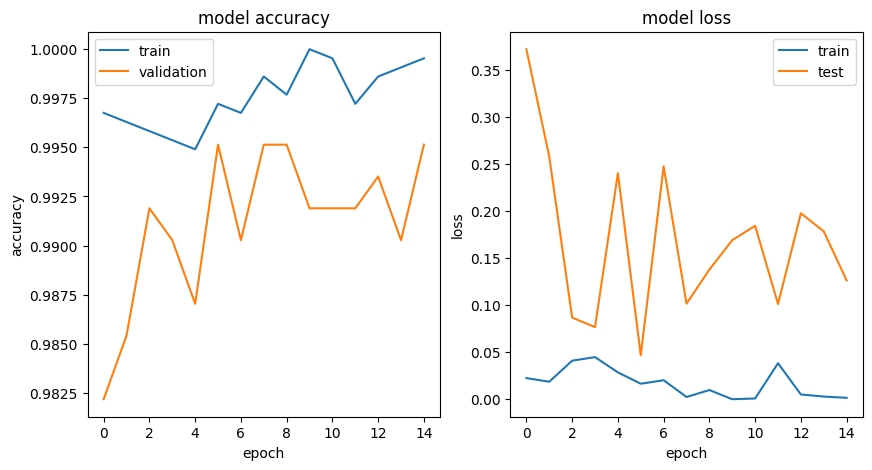

In [76]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

In [77]:
preds = np.argmax(model_transfer.predict(test_features), axis=1)
print("\nAccuracy on Test Data: ", accuracy_score(test_y, preds))
print("\nNumber of correctly identified imgaes: ",
      accuracy_score(test_y, preds, normalize=False),"\n")
confusion_matrix(test_y, preds, labels=range(0,6))

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

Accuracy on Test Data:  0.9967637540453075

Number of correctly identified imgaes:  308.0 



array([[101,   0,   0,   0,   0,   0],
       [  0, 101,   0,   0,   0,   0],
       [  0,   1, 106,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0]])

implementing another iteration of transfer learning

In [78]:
model_transfer = Sequential()
model_transfer.add(GlobalAveragePooling2D(input_shape=train_features.shape[1:]))
model_transfer.add(Dropout(0.3))
model_transfer.add(Dense(50, activation='relu'))
model_transfer.add(Dense(6, activation='softmax'))
model_transfer.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 50)             │        25,650 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 6)              │           306 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,956 (101.39 KB)

 Trainable params: 25,956 (101.39 KB)

 Non-trainable params: 0 (0.00 B)

In [79]:
model_transfer.compile(loss='categorical_crossentropy', optimizer='adam',
              metrics=['accuracy'])
history = model_transfer.fit(train_features, y_train, batch_size=8, epochs=25,
          validation_data=(val_features, y_val), callbacks=[checkpointer],
          verbose=1, shuffle=True)

Epoch 1/25
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7939 - loss: 1.6870
Epoch 1: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7944 - loss: 1.6827 - val_accuracy: 0.9903 - val_loss: 0.0831
Epoch 2/25
252/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9886 - loss: 0.0511
Epoch 2: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9885 - loss: 0.0519 - val_accuracy: 0.9887 - val_loss: 0.1087
Epoch 3/25
252/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9898 - loss: 0.0503
Epoch 3: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9896 - loss: 0.0513 - val_accuracy: 0.9854 - val_loss: 0.1529
Epoch 4/25
257/270 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9929 - loss: 0.0501
Epoch 4: val_loss did not improve from 0.03384
270/270 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9928 - loss: 0.0501 - val_accuracy: 0.9935 - val_loss: 0.0536

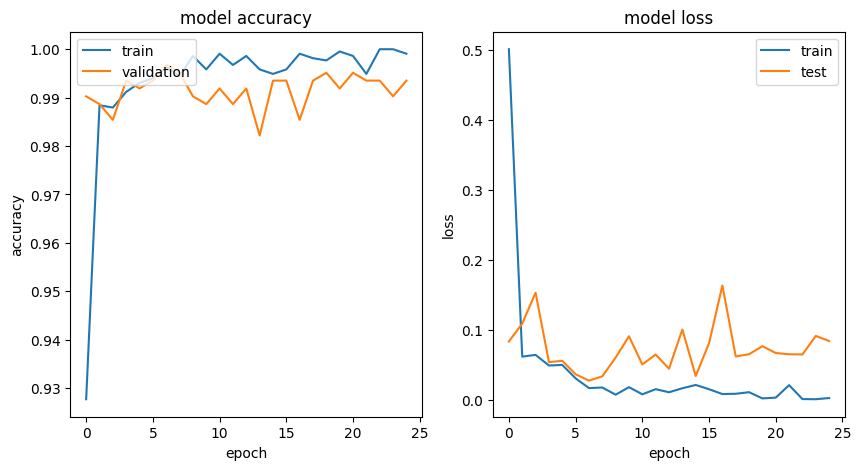

In [80]:
fig = plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

In [81]:
preds = np.argmax(model_transfer.predict(test_features), axis=1)
print("\nAccuracy on Test Data: ", accuracy_score(test_y, preds))
print("\nNumber of correctly identified imgaes: ",
      accuracy_score(test_y, preds, normalize=False),"\n")
confusion_matrix(test_y, preds, labels=range(0,6))

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step

Accuracy on Test Data:  0.9935275080906149

Number of correctly identified imgaes:  307.0 



array([[101,   0,   0,   0,   0,   0],
       [  1, 100,   0,   0,   0,   0],
       [  1,   0, 106,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0]])

implementing Data augmentation

In [82]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define data augmentation
datagen_train = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Fit the augmentation to your data
datagen_train.fit(train_x)


In [83]:
from tensorflow.keras.layers import Dropout

# Building up a Sequential model with dropout
checkpointer = ModelCheckpoint(filepath='1scratchmodel.best.keras',
                               verbose=1,save_best_only=True)

model_scratch = Sequential()
model_scratch.add(Conv2D(32, (3, 3), activation='relu',input_shape = train_x.shape[1:]))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))
model_scratch.add(Dropout(0.25))

model_scratch.add(Conv2D(64, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))
model_scratch.add(Dropout(0.25))

model_scratch.add(Conv2D(64, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))
model_scratch.add(Dropout(0.25))

model_scratch.add(Conv2D(128, (3, 3), activation='relu'))
model_scratch.add(MaxPooling2D(pool_size=(2, 2)))
model_scratch.add(Dropout(0.25))

model_scratch.add(GlobalAveragePooling2D())
model_scratch.add(Dense(64, activation='relu'))
model_scratch.add(Dropout(0.5))
model_scratch.add(Dense(6, activation='softmax'))
model_scratch.summary()


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 52, 52, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 138,822 (542.27 KB)

 Trainable params: 138,822 (542.27 KB)

 Non-trainable params: 0 (0.00 B)

In [84]:
# Compile the model
model_scratch.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model using data augmentation
history = model_scratch.fit(datagen_train.flow(train_x, y_train, batch_size=8),
                            epochs=20, verbose=1, callbacks=[checkpointer],
                            validation_data=(val_x, y_val), shuffle=True)

Epoch 1/20
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.4533 - loss: 4.4224
Epoch 1: val_loss improved from inf to 0.79935, saving model to 1scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 42s 126ms/step - accuracy: 0.4535 - loss: 4.4125 - val_accuracy: 0.7277 - val_loss: 0.7993
Epoch 2/20
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - accuracy: 0.6022 - loss: 0.8356
Epoch 2: val_loss improved from 0.79935 to 0.64982, saving model to 1scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 29s 108ms/step - accuracy: 0.6024 - loss: 0.8354 - val_accuracy: 0.7666 - val_loss: 0.6498
Epoch 3/20
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - accuracy: 0.6789 - loss: 0.7124
Epoch 3: val_loss improved from 0.64982 to 0.60730, saving model to 1scratchmodel.best.keras
270/270 ━━━━━━━━━━━━━━━━━━━━ 27s 100ms/step - accuracy: 0.6788 - loss: 0.7125 - val_accuracy: 0.7342 - val_loss: 0.6073
Epoch 4/20
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.6890 - loss: 0.7032
Epoch 4: val_lo

In [85]:
import os
from tensorflow.keras.utils import load_img, img_to_array, to_categorical
from keras.applications import imagenet_utils
import numpy as np


test_images = []
test_labels = []  # Initialize test_labels as an empty list

for image_path in test:
    image = load_img(image_path, target_size=(224, 224))
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)
    image = imagenet_utils.preprocess_input(image)
    test_images.append(image)

    # Extract the label from the image path (assuming it's in the filename)
    label = int(image_path.split('/')[-1].split('_')[0])
    test_labels.append(label)

# Convert lists to NumPy arrays
test_images = np.vstack(test_images)
test_labels = np.array(test_labels)

# Use tensorflow.keras.utils.to_categorical for one-hot encoding
test_labels = to_categorical(test_labels, 6)  # Corrected function call

# Evaluate the model
loss, accuracy = model_scratch.evaluate(test_images, test_labels)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6454 - loss: 0.7566
Test Loss: 0.42364758253097534
Test Accuracy: 0.7961165308952332


In [86]:
import numpy as np
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [87]:
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [88]:
for layer in base_model.layers:
    layer.trainable = False


In [89]:
model = Sequential([
    base_model,
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(6, activation='softmax')  # Assuming 3 classes
])


In [90]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])


In [91]:
datagen = ImageDataGenerator(
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest")



In [92]:
history = model.fit(datagen.flow(train_x, y_train, batch_size=32),
                    validation_data=(val_x, y_val),
                    epochs=20,
                    callbacks=[ModelCheckpoint('vgg19_finetuned.h5', save_best_only=True)])


Epoch 1/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.6842 - loss: 6.9963

68/68 ━━━━━━━━━━━━━━━━━━━━ 43s 568ms/step - accuracy: 0.6866 - loss: 6.9392 - val_accuracy: 0.9854 - val_loss: 0.3701
Epoch 2/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step - accuracy: 0.9637 - loss: 0.8068

68/68 ━━━━━━━━━━━━━━━━━━━━ 37s 543ms/step - accuracy: 0.9637 - loss: 0.8067 - val_accuracy: 0.9854 - val_loss: 0.3080
Epoch 3/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 487ms/step - accuracy: 0.9721 - loss: 0.5727 - val_accuracy: 0.9870 - val_loss: 0.3548
Epoch 4/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step - accuracy: 0.9676 - loss: 0.4389

68/68 ━━━━━━━━━━━━━━━━━━━━ 45s 559ms/step - accuracy: 0.9676 - loss: 0.4386 - val_accuracy: 0.9935 - val_loss: 0.2527
Epoch 5/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 489ms/step - accuracy: 0.9824 - loss: 0.3940 - val_accuracy: 0.9919 - val_loss: 0.2866
Epoch 6/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 42s 507ms/step - accuracy: 0.9790 - loss: 0.4293 - val_accuracy: 0.9919 - val_loss: 0.3146
Epoch 7/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 507ms/step - accuracy: 0.9850 - loss: 0.3342 - val_accuracy: 0.9903 - val_loss: 0.3363
Epoch 8/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 513ms/step - accuracy: 0.9707 - loss: 0.6164 - val_accuracy: 0.9919 - val_loss: 0.3091
Epoch 9/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 510ms/step - accuracy: 0.9902 - loss: 0.1658 - val_accuracy: 0.9903 - val_loss: 0.3734
Epoch 10/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 41s 504ms/step - accuracy: 0.9885 - loss: 0.1839 - val_accuracy: 0.9935 - val_loss: 0.2561
Epoch 11/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step - accuracy: 0.9855 - loss: 0.3227

68/68 ━━━━━━━━━━━━━━━━━━━━ 44s 642ms/step - accuracy: 0.9855 - loss: 0.3226 - val_accuracy: 0.9951 - val_loss: 0.1442
Epoch 12/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 478ms/step - accuracy: 0.9879 - loss: 0.2652 - val_accuracy: 0.9919 - val_loss: 0.2983
Epoch 13/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 499ms/step - accuracy: 0.9882 - loss: 0.1332 - val_accuracy: 0.9935 - val_loss: 0.2208
Epoch 14/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 479ms/step - accuracy: 0.9870 - loss: 0.1511 - val_accuracy: 0.9919 - val_loss: 0.2867
Epoch 15/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 34s 495ms/step - accuracy: 0.9941 - loss: 0.1210 - val_accuracy: 0.9951 - val_loss: 0.1812
Epoch 16/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 32s 473ms/step - accuracy: 0.9901 - loss: 0.2089 - val_accuracy: 0.9919 - val_loss: 0.3011
Epoch 17/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 35s 509ms/step - accuracy: 0.9935 - loss: 0.1332 - val_accuracy: 0.9919 - val_loss: 0.1907
Epoch 18/20
68/68 ━━━━━━━━━━━━━━━━━━━━ 33s 484ms/step - accuracy: 0.9888 - loss: 0.2797 - val_accuracy

In [93]:
loss, accuracy = model.evaluate(test_x, y_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 277ms/step - accuracy: 0.9933 - loss: 0.1518
Test Loss: 0.23023487627506256
Test Accuracy: 0.9935275316238403


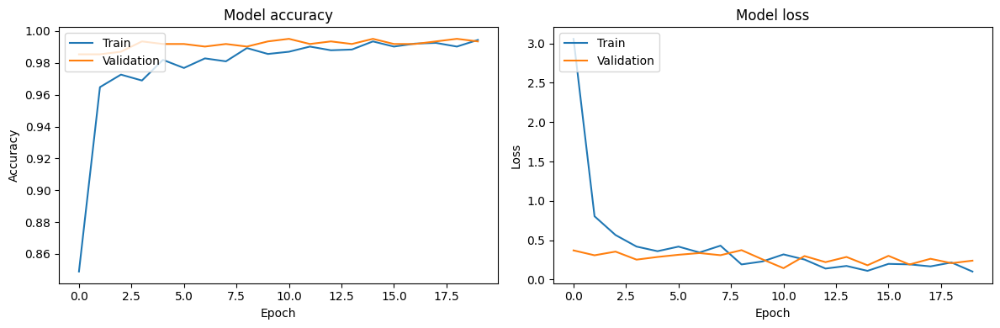

In [94]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 227ms/step


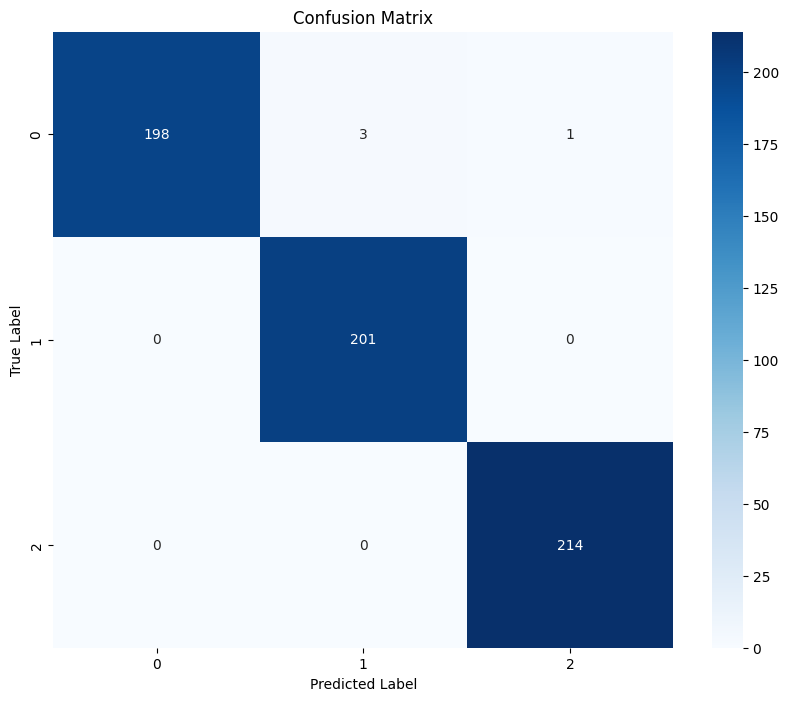

In [95]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Predict the values from the validation dataset
y_pred = model.predict(val_x)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_val, axis=1)

# Compute the confusion matrix
confusion_mtx = confusion_matrix(y_true, y_pred_classes)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_mtx, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


implementing another iteration to obtain a better performance.

In [96]:
import os
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
from tensorflow.keras.utils import to_categorical  # Import to_categorical

# Path to the test directory
test_dir = '/content/drive/MyDrive/ruchir/Photo Tagging/ruchir/test'

# List all image paths in the test directory
test_image_paths = [os.path.join(test_dir, img_name) for img_name in os.listdir(test_dir)]

# Load and preprocess the test images
test_images = []
for img_path in test_image_paths:
    img = load_img(img_path, target_size=(224, 224))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = img / 255.0  # Rescale
    test_images.append(img)

# Convert to a single numpy array
test_images = np.vstack(test_images)

# Extract true labels from the filenames
test_labels = [int(img_path.split("/")[-1].split("_")[0]) for img_path in test_image_paths]
test_labels = to_categorical(test_labels, 6)  # Change 3 to 6 to match model's output

# Evaluate the model
loss, accuracy = model.evaluate(test_images, test_labels)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy*100:.2f}%")

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.9841 - loss: 0.1395
Test Loss: 0.1443842351436615
Test Accuracy: 97.41%


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


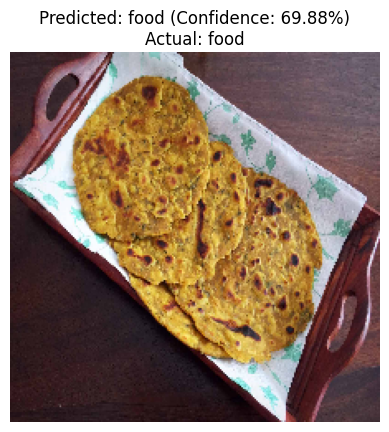

In [97]:
import random
import matplotlib.pyplot as plt

# Randomly select an image from the test directory
random_img_path = random.choice(test_image_paths)

# Load and preprocess the image
img = load_img(random_img_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Rescale

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions)
confidence = predictions[0][predicted_class]

# Extract the actual label from the filename
actual_label = int(random_img_path.split("/")[-1].split("_")[0])

# Map class indices to class names
class_names = ['ambience', 'food', 'menu']

# Display the results
plt.imshow(img)
plt.title(f"Predicted: {class_names[predicted_class]} (Confidence: {confidence*100:.2f}%)\nActual: {class_names[actual_label]}")
plt.axis('off')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


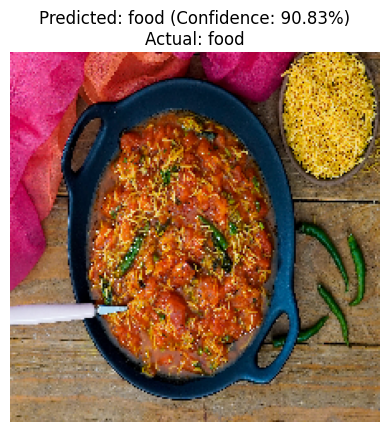

In [98]:
import random
import matplotlib.pyplot as plt

# Randomly select an image from the test directory
random_img_path = random.choice(test_image_paths)

# Load and preprocess the image
img = load_img(random_img_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Rescale

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions)
confidence = predictions[0][predicted_class]

# Extract the actual label from the filename
actual_label = int(random_img_path.split("/")[-1].split("_")[0])

# Map class indices to class names
class_names = ['ambience', 'food', 'menu']

# Display the results
plt.imshow(img)
plt.title(f"Predicted: {class_names[predicted_class]} (Confidence: {confidence*100:.2f}%)\nActual: {class_names[actual_label]}")
plt.axis('off')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


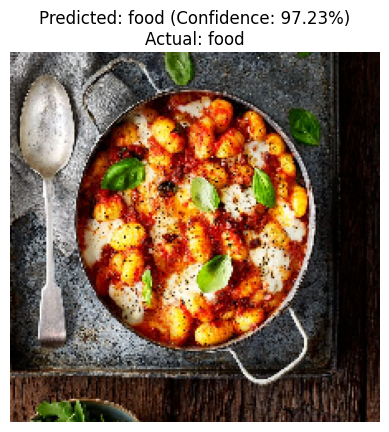

In [99]:
import matplotlib.pyplot as plt

# Specify the path to the image
img_path = "/content/drive/MyDrive/ruchir/Photo Tagging/dataset/1.jpg"

# Load and preprocess the image
img = load_img(img_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Rescale

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions)
confidence = predictions[0][predicted_class]

# Extract the actual label from the filename - MODIFIED
# Assuming 'food' in the path indicates class 1
actual_label = 1

# Map class indices to class names
class_names = ['ambience', 'food', 'menu']

# Display the results
plt.imshow(img)
plt.title(f"Predicted: {class_names[predicted_class]} (Confidence: {confidence*100:.2f}%)\nActual: {class_names[actual_label]}")
plt.axis('off')
plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


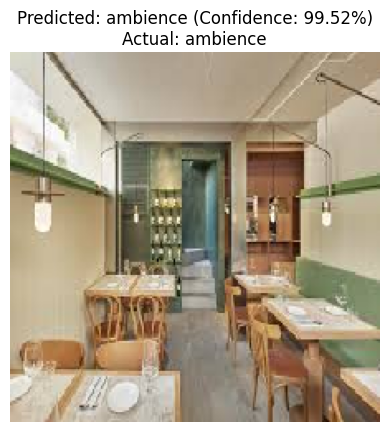

In [100]:
import matplotlib.pyplot as plt

# Specify the path to the image
img_path = "/content/drive/MyDrive/ruchir/Photo Tagging/dataset/2.jpeg"

# Load and preprocess the image
img = load_img(img_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Rescale

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions)
confidence = predictions[0][predicted_class]

# Extract the actual label from the filename
actual_label = 0

# Map class indices to class names
class_names = ['ambience', 'food', 'menu']

# Display the results
plt.imshow(img)
plt.title(f"Predicted: {class_names[predicted_class]} (Confidence: {confidence*100:.2f}%)\nActual: {class_names[actual_label]}")
plt.axis('off')
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step


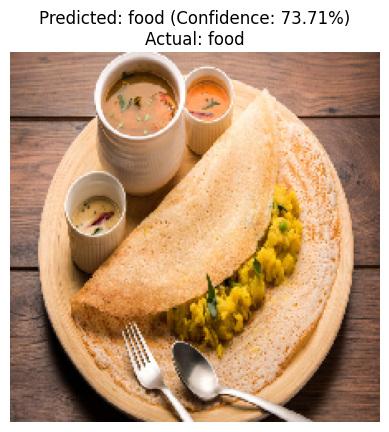

In [102]:
import matplotlib.pyplot as plt

# Specify the path to the image, make sure it exists!
img_path = "/content/drive/MyDrive/ruchir/Photo Tagging/dataset/3.jpg"

# Load and preprocess the image
img = load_img(img_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Rescale

# Make a prediction
predictions = model.predict(img_array)
predicted_class = np.argmax(predictions)
confidence = predictions[0][predicted_class]

actual_label = 1  # Replace with appropriate logic for your filenames

# Map class indices to class names
class_names = ['ambience', 'food', 'menu']

# Display the results
plt.imshow(img)
plt.title(f"Predicted: {class_names[predicted_class]} (Confidence: {confidence*100:.2f}%)\nActual: {class_names[actual_label]}")
plt.axis('off')
plt.show()

Another iteration for data augmentation

In [103]:
history = model.fit(datagen.flow(train_x, y_train, batch_size=8),
                    validation_data=(val_x, y_val),
                    epochs=40,
                    callbacks=[ModelCheckpoint('1vgg19_finetuned.h5', save_best_only=True)])

Epoch 1/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.9880 - loss: 0.2496

270/270 ━━━━━━━━━━━━━━━━━━━━ 57s 187ms/step - accuracy: 0.9880 - loss: 0.2501 - val_accuracy: 0.9935 - val_loss: 0.3132
Epoch 2/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 37s 135ms/step - accuracy: 0.9795 - loss: 0.6649 - val_accuracy: 0.9919 - val_loss: 0.3230
Epoch 3/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - accuracy: 0.9894 - loss: 0.3446 - val_accuracy: 0.9870 - val_loss: 0.5866
Epoch 4/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - accuracy: 0.9888 - loss: 0.2555 - val_accuracy: 0.9935 - val_loss: 0.4683
Epoch 5/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - accuracy: 0.9856 - loss: 0.4043 - val_accuracy: 0.9887 - val_loss: 0.5808
Epoch 6/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - accuracy: 0.9894 - loss: 0.2164 - val_accuracy: 0.9919 - val_loss: 0.4048
Epoch 7/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - accuracy: 0.9897 - loss: 0.4531 - val_accuracy: 0.9903 - val_loss: 0.3426
Epoch 8/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - accuracy: 0.9920 - loss: 0.2774 - val

270/270 ━━━━━━━━━━━━━━━━━━━━ 52s 192ms/step - accuracy: 0.9926 - loss: 0.4660 - val_accuracy: 0.9951 - val_loss: 0.3051
Epoch 15/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 65s 129ms/step - accuracy: 0.9968 - loss: 0.1130 - val_accuracy: 0.9919 - val_loss: 0.4594
Epoch 16/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 128ms/step - accuracy: 0.9965 - loss: 0.0684 - val_accuracy: 0.9951 - val_loss: 0.3135
Epoch 17/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 33s 124ms/step - accuracy: 0.9959 - loss: 0.1387 - val_accuracy: 0.9935 - val_loss: 0.3955
Epoch 18/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - accuracy: 0.9975 - loss: 0.0337 - val_accuracy: 0.9935 - val_loss: 0.4358
Epoch 19/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - accuracy: 0.9947 - loss: 0.2087 - val_accuracy: 0.9935 - val_loss: 0.4062
Epoch 20/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - accuracy: 0.9956 - loss: 0.1568 - val_accuracy: 0.9919 - val_loss: 0.4875
Epoch 21/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - accuracy: 0.9975 - loss: 0.162

270/270 ━━━━━━━━━━━━━━━━━━━━ 44s 162ms/step - accuracy: 0.9951 - loss: 0.1947 - val_accuracy: 0.9968 - val_loss: 0.2843
Epoch 29/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 128ms/step - accuracy: 0.9952 - loss: 0.3534 - val_accuracy: 0.9935 - val_loss: 0.4645
Epoch 30/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 36s 135ms/step - accuracy: 0.9980 - loss: 0.0538 - val_accuracy: 0.9903 - val_loss: 0.6371
Epoch 31/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 131ms/step - accuracy: 0.9951 - loss: 0.0389 - val_accuracy: 0.9935 - val_loss: 0.4572
Epoch 32/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 129ms/step - accuracy: 0.9929 - loss: 0.3474 - val_accuracy: 0.9887 - val_loss: 1.6477
Epoch 33/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - accuracy: 0.9985 - loss: 0.1565 - val_accuracy: 0.9935 - val_loss: 0.8700
Epoch 34/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 35s 128ms/step - accuracy: 0.9978 - loss: 0.0744 - val_accuracy: 0.9935 - val_loss: 0.8915
Epoch 35/40
270/270 ━━━━━━━━━━━━━━━━━━━━ 34s 125ms/step - accuracy: 0.9907 - loss: 0.520

In [104]:
loss, accuracy = model.evaluate(test_x, y_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.9933 - loss: 0.3290
Test Loss: 0.31918928027153015
Test Accuracy: 0.9935275316238403


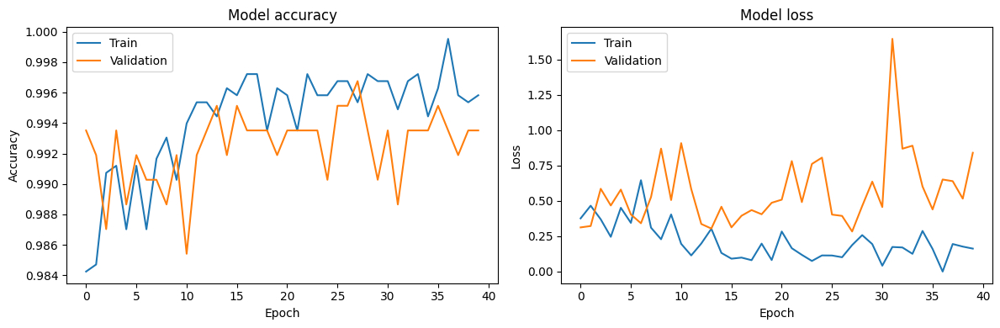

In [105]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [106]:
# Save the trained model
model.save('model.h5')

# Download it to your local system
from google.colab import files
files.download('model.h5')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>